# Diffuser Library

"Stable Diffusion" 是一种文本到图像的潜在扩散模型，由 CompVis、Stability AI 和 LAION 的研究人员和工程师创建。它是在 LAION-5B 数据库的一个子集上训练的，图像尺寸为 512x512 像素。

In [ ]:
#| hide
!nvidia-smi

In [ ]:
#| hide
!pip install -Uq diffusers transformers fastcore
!pip install accelerate

## StableDiffusionPipeline

常用的模型结构

*   CompVis/stable-diffusion-v1-4
*   runwayml/stable-diffusion-v1-5
*   stabilityai/stable-diffusion-2-1-base
*   stabilityai/stable-diffusion-2-1



In [ ]:
#|hide
import torch
from PIL import Image
import gc
import matplotlib.pyplot as plt
import numpy as np
%matplotlib  inline

In [ ]:
from diffusers import StableDiffusionPipeline

torch_device='cuda' if torch.cuda.is_available() else 'cpu'
def release_cache():
    gc.collect()
    torch.cuda.empty_cache()
    print(torch.cuda.list_gpu_processes())

#把图片排成 rows,cols的网格中，先排cols,后排rows
#其中len(imgs)=cols x rows
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

StableDiffusionPipeline封装了SD的全部功能，是huggingface提供的统一对外api接口。

In [ ]:
#模型保存在： ~/.cache/huggingface/hub
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", 
                                               # revision="fp16", 
                                               torch_dtype=torch.float32,mirror='bfsu')#tuna
pipe.to(torch_device)

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

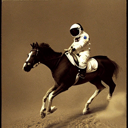

In [ ]:
torch.manual_seed(1)

prompt = "a photograph of an astronaut riding a horse"
image=pipe(prompt).images[0] #每个提示产生一张图片
image.save('astronaut.png')
image.resize((128,128)) #PIL.Image，size=512,512

### num_inference_steps
每次生成图片迭代的次数，次数越多，效果自然越好！

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

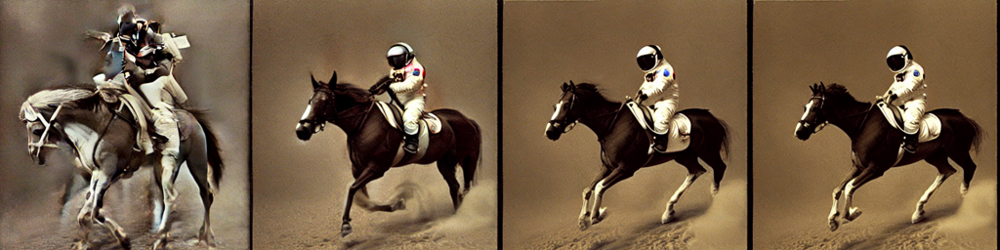

In [ ]:
gens=[]
for s in [5,15,30,50]:
  torch.manual_seed(1)
  image=pipe(prompt,num_inference_steps=s).images[0] #默认inference_steps=50
  gens.append(image)
image_grid(gens, 1, 4).resize((1024,256))

### guidance_scale
* 多大表示【生成的图片】越来越匹配提示词
* 越小表示【生成的图片】是一张图片
* 默认是7.5

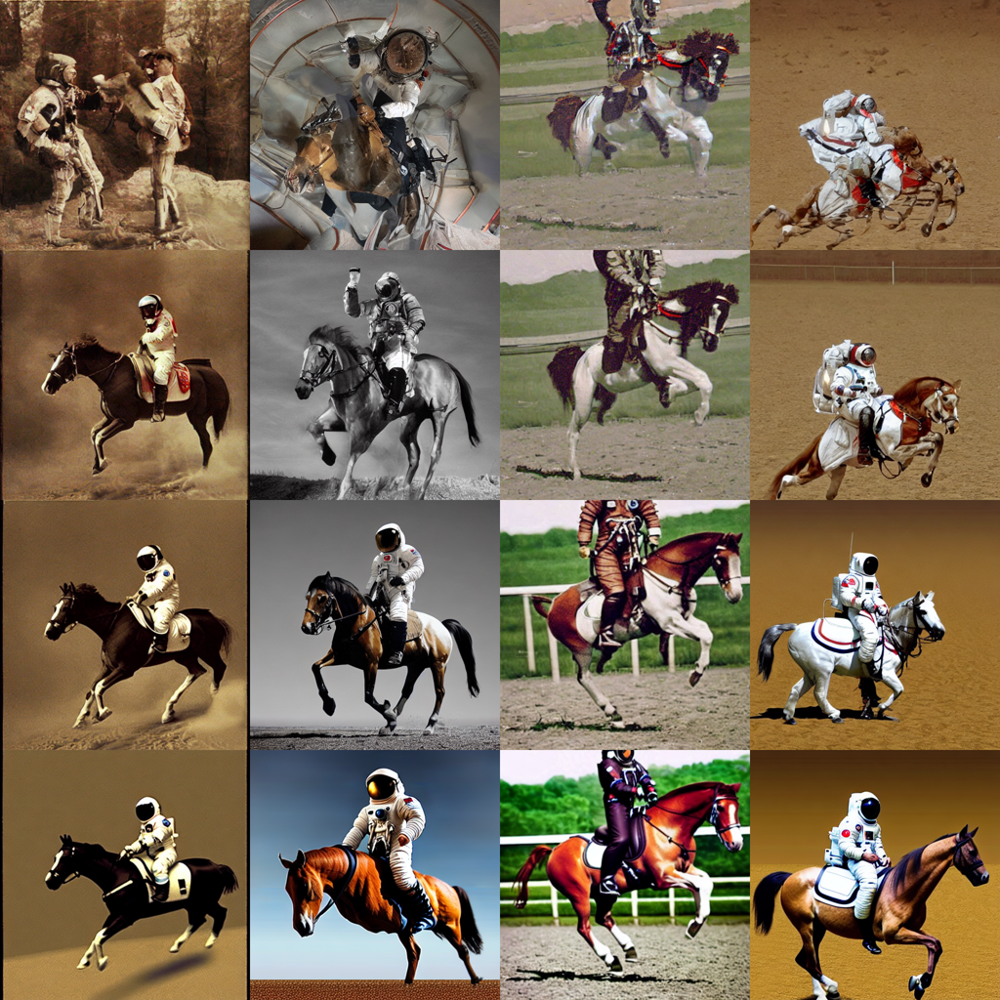

In [ ]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols #一次生成4张图

gens=[]
for g in [1.1,3,7,14]:
  torch.manual_seed(1)
  imgs=pipe(prompts, guidance_scale=g).images
  gens.extend(imgs)
image_grid(gens,num_rows,num_cols).resize((1024,1024))

### 非标准分辨率图片的生成

  0%|          | 0/50 [00:00<?, ?it/s]

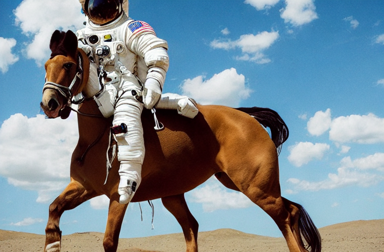

In [ ]:
image = pipe(prompt, height=512, width=768).images[0]
image.resize((768//2,252))

### Negative Prompt

否定的提示词,指示生成图片去掉【提示否定】的特征

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

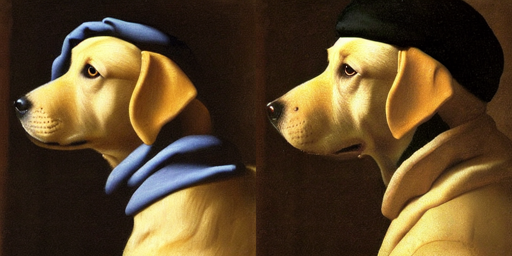

In [ ]:
#维米尔风格的拉布拉多猎犬
prompt = "Labrador in the style of Vermeer" 
# prompt = "gril  in the style of Vermeer"
torch.manual_seed(1000)
origin_img=pipe(prompt).images[0]

torch.manual_seed(1000)
neg_img=pipe(prompt,negative_prompt="blue").images[0]

image_grid([origin_img,neg_img],1,2).resize((512,256))

### StableDiffusionImg2ImgPipeline

strength: 越小越接近原来的init_image

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload
import torch
release_cache()

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16,
)

pipe.to("cuda")

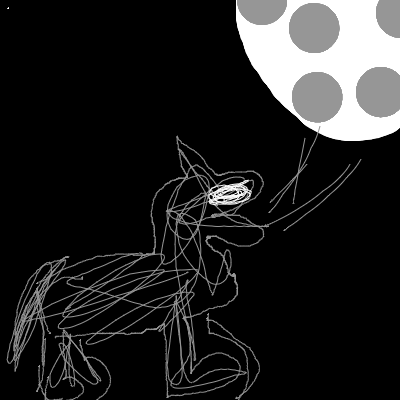

In [ ]:
#guide  image
p = FastDownload().download('https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

  0%|          | 0/70 [00:00<?, ?it/s]

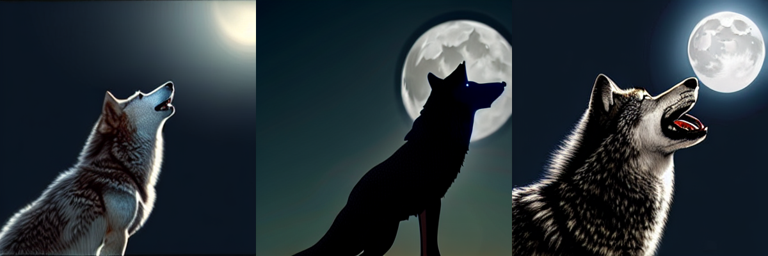

In [ ]:
torch.manual_seed(1000)

# "Oil painting of wolf howling at the moon by Van Gogh"
prompt = "Wolf howling at the moon, photorealistic 4K"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3).resize((256*3,256))

In [ ]:
init_image_van=images[2].copy()

In [ ]:
from transformers.models.ibert.modeling_ibert import gelu
# 梵高的一幅油画，画的是狼对着月亮嚎叫
prompt ="Oil painting of wolf howling at the moon by Van Gogh"
gen=[]
for x in [(0.8,50),(0.8,70),(1,50),(1,70)]:
  images = pipe(prompt=prompt, 
                num_images_per_prompt=3, 
                image=init_image_van, 
                strength=x[0], 
                num_inference_steps=x[1]).images
  gen.extend(images)

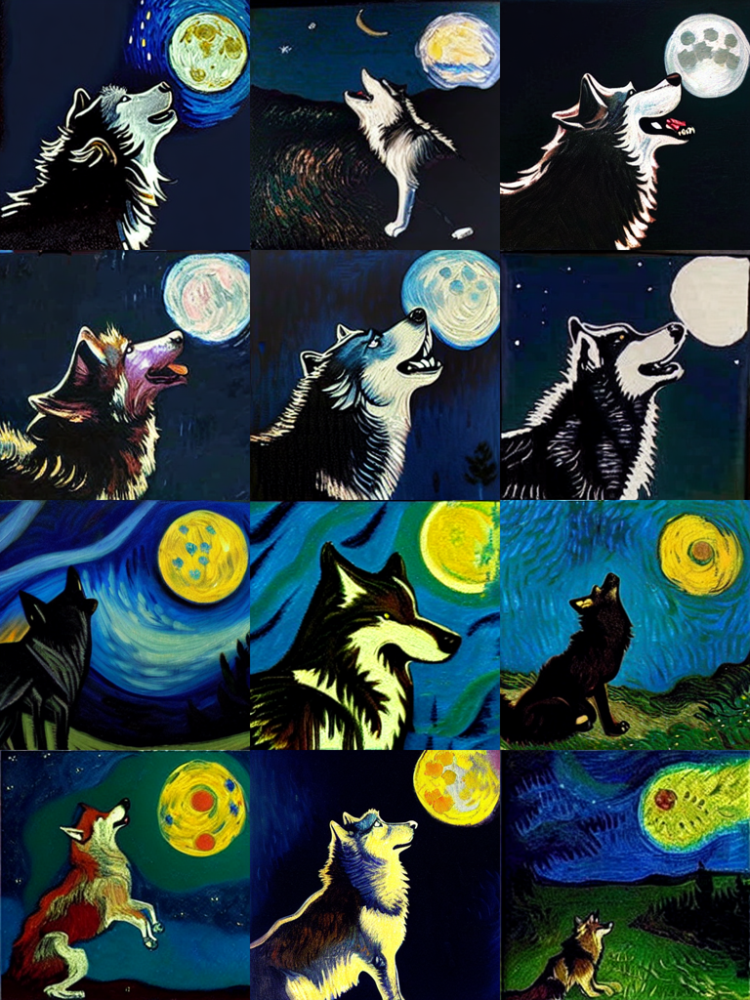

In [ ]:
image_grid(gen, 4, 3).resize((768,1024))

### Textual Inversion

Textual Inversion是通过训练clip_encoder词嵌入层，使某个emdding vector表示某种风格的特征，然后用这个新的embbeding vector来生成图片。
多么聪明的想法啊。

A.模型准备

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

B.准备已经训练好的词向量。

In [ ]:
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")

C.词向量加入到CLIP_Encoder的embbeding层。

In [ ]:
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

D.修改提示词，生成个性化图片。

  0%|          | 0/50 [00:00<?, ?it/s]

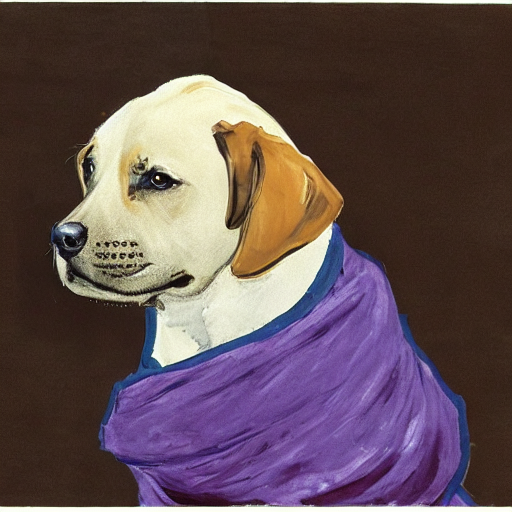

In [ ]:
torch.manual_seed(1000)
image = pipe("Labrador  in the style of <watercolor-portrait>").images[0]
image

# stable diffuse模型的工作原理


Diffuse模型的三大组件

1. An autoencoder (VAE).
2. A [U-Net](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=wW8o1Wp0zRkq).
3. A text-encoder, *e.g.* [CLIP's Text Encoder](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**1. The autoencoder (VAE)**

编码器由于训练时候生成latent varible，实现压缩。
解码器在推理时候用于重新构造图片。


**2. The U-Net**
U-Net 输出预测噪声残差，可以用于计算预测去噪图像表示。
*  为了防止 U-Net 在下采样时丢失重要信息，通常在编码器的下采样 ResNet 和解码器的上采样 ResNet 之间添加 shortcut 连接。
* Stable Diffusion U-Net 可以通过交叉注意层将其输出条件化为文本嵌入。交叉注意层通常添加在 U-Net 的编码器和解码器部分之间的 ResNet 块之间。??

**3. The Text-encoder**

文本编码器负责将输入提示，例如“骑马的宇航员”转换为可以被 U-Net 理解的嵌入空间。通常，它是一个简单的基于 transformer 的编码器，将一系列输入标记映射到一系列潜在的文本嵌入。

受  的启发，Stable Diffusion 在训练期间不会训练文本编码器，而是直接使用 CLIP 的已经训练好的文本编码器 


## Stable Diffusion 推理阶段

<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>


* 稳定扩散模型将潜在种子和文本提示作为输入。然后，使用潜在种子生成大小为 64×64 的随机潜在图像表示
* 文本提示通过 CLIP 的文本编码器转换为大小为 77×768 的文本嵌入。

* U-Net 在被条件化的文本嵌入的作用下，迭代地去噪随机潜在图像表示。

U-Net 的输出是噪声残差，通过调度算法(Schedular)计算去噪潜在图像表示。可以使用许多不同的调度算法进行此计算，每个算法都有其优缺点。对于 Stable Diffusion，我们建议使用以下之一：

- [PNDM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py) (used by default).
- [K-LMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py).
- [Heun Discrete scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_heun_discrete.py).
- [DPM Solver Multistep scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_dpmsolver_multistep.py). 可以较少推理步数到25

## VAE

vae的目的是把图片转换成对应的latent，然后输入到unet进行生成操作，对latent的操作相对于raw image大幅度减少运算量。

In [ ]:
from diffusers import AutoencoderKL,UNet2DConditionModel,LMSDiscreteScheduler
from transformers import CLIPTextModel, CLIPTokenizer
import torch,numpy as np 
from torchvision import transforms as tfms
from  PIL import Image

In [ ]:
with torch.no_grad():
    vae=AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae",mirror='bfsu').to(torch_device)

VAE encoder的输入,decoder的输出范围是在[-1,1]之间，图片的取值范围是[0,1]，所以不要忘记输入输出的线性转换.

In [ ]:
def tfms2Img(r):
    """[-1,-1]->[0,1]"""
    r=(0.5*r+0.5)
    return r.float().clamp(0,1)
def tfms2Latent(r):
    """[0,1]->[-1,-1]"""
    return 2*r-1

with torch.no_grad():
    I=torch.rand(1,3,512,512).to(vae.device)
    I=tfms2Latent(I)
    # 编码
    latents=vae.encode(I).latent_dist.sample()
    # 解码
    I_pred=vae.decode(latents).sample
  
    I_pred=tfms2Img(I_pred)
    print(I_pred.min(),I_pred.max())

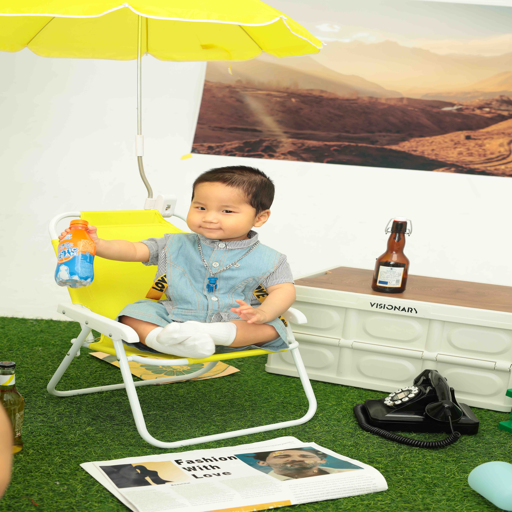

In [ ]:
input_image = Image.open('yangyang.jpg').rotate(0).resize((512,512))
input_image

In [ ]:
@torch.no_grad()
def pil2Latents(input_image:Image)-> torch.FloatTensor:
    '''
    把图片转换成vae的输入
    返回：size=[1,4,64,64]
    '''
    ts=tfms.ToTensor()(input_image).unsqueeze(0)
    ts=tfms2Latent(ts).to(vae.device,vae.dtype)
    return 0.18215*vae.encode(ts).latent_dist.sample()
@torch.no_grad()
def latents2Pil(latents:torch.FloatTensor) ->Image:
    '''
    把隐变量还原成PIL.Image
    latents: FloatTensor,size=[1,4,64,64]
    '''
    decode_img=vae.decode(latents/0.18215).sample.detach().cpu()
    decode_img=decode_img.permute(0,2,3,1).squeeze()
    decode_img=tfms2Img(decode_img)

    arr_img=decode_img.numpy()*255
    arr_img=arr_img.astype('uint8')
    return Image.fromarray(arr_img)

In [ ]:
#| hide
#一下代码哪里错了？为什么没法正确解码？
def pil2Latents_fake(input_image:Image)-> torch.FloatTensor:
    '''
    把图片转换成vae的输入
    返回：size=[1,4,64,64]
    '''
    ts=tfms.ToTensor()(input_image).unsqueeze(0)
    ts=tfms2Latent(ts).to(vae.device)
    latents=vae.encoder(ts)
    mean,logsigma=latents[:,:4],latents[:,4:]
    Z=torch.rand_like(logsigma)
    latents=0*torch.exp(logsigma)*Z+mean
    return 0.18215*latents
def latents2Pil_fake(latents:torch.FloatTensor) ->Image:
    '''
    把隐变量还原成PIL.Image
    latents: FloatTensor,size=[1,4,64,64]
    '''
    decode_img=vae.decoder(latents/0.18215).detach().cpu()
    decode_img=decode_img.permute(0,2,3,1).squeeze()
    decode_img=tfms2Img(decode_img)

    arr_img=decode_img.numpy()*255
    arr_img=arr_img.astype('uint8')
    return Image.fromarray(arr_img)

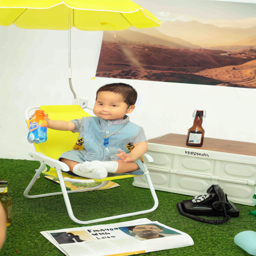

In [ ]:
with torch.no_grad():
    z=pil2Latents(input_image)
    input_image_decoded=latents2Pil(z)
input_image_decoded.resize((256,256))

下面代码用于查看下latent，可以看出1,2通道的latent表示的是图片的内容，3，4通道的latent表示的是图片的细节

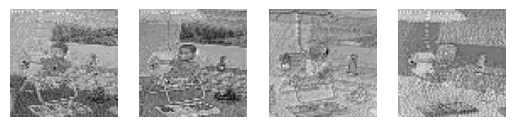

In [ ]:
np_latent=z.cpu().numpy()[0]
_,axes=plt.subplots(1,4)

for i in range(4):
    axes[i].imshow(np_latent[i],cmap='gray')
    axes[i].axis('off')

## CLIPTextModel

CLIP模型根据提示词prompt，驱动unet生成我们描述的图片。huggingface的stable-diffusion使用的是`openai/clip-vit-base-patch32`模型，此模型并没有参与过sd的训练。

In [ ]:
#subfolder参数 可以理解成子类
tokenizer    = CLIPTokenizer.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="tokenizer",mirror='tuna')
text_encoder = CLIPTextModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="text_encoder",mirror='tuna')

使用text_encoder,直接对prompt进行编码，生成对应的embedding。

In [ ]:
prompt='Drake as a pokemon, small, monster, manga'
input_text=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,truncation=True,return_tensors='pt')
print("inp.size:",input_text.input_ids.shape)


with torch.no_grad():
    #只输入input_ids，不输入attention_mask,为什么呢？
    out_encoder=text_encoder(input_text.input_ids)
    print("embbeding size:",out_encoder.last_hidden_state.shape)

inp.size: torch.Size([1, 77])
embbeding size: torch.Size([1, 77, 768])


**注意** 从上面的例子我们可以看出,clip-vit其实是个解码器的结构，$h_t$的输出只依赖与$x_0,x_1,x_t$

下面可以看到，索引与对应subword的关系

In [ ]:
for idx in input_text.input_ids[0][:12]:
    print(f"{idx}  {tokenizer.decoder.get(int(idx))}")

49406  <|startoftext|>
8958  drake</w>
601  as</w>
320  a</w>
9528  pokemon</w>
267  ,</w>
2442  small</w>
267  ,</w>
6060  monster</w>
267  ,</w>
11873  manga</w>
49407  <|endoftext|>


### 模型拆解，embdding,encoder,final_layers

In [ ]:
model_embeddings=text_encoder.text_model.embeddings
model_encoder   =text_encoder.text_model.encoder
model_finallayer=text_encoder.text_model.final_layer_norm

分两步进行输出，第一步输出token_embdding,第二步输出transformer_final_embbeding

In [ ]:
out_emb=model_embeddings(input_text.input_ids)

def get_output_embds(out_emb):
    causal_attention_mask = text_encoder.text_model._build_causal_attention_mask(1, tokenizer.model_max_length, dtype=out_emb.dtype)
    print(causal_attention_mask[0,0,:4,:4])
    out_encoder=model_encoder(inputs_embeds=out_emb,
                              causal_attention_mask=causal_attention_mask,
                              output_hidden_states=True)
    out_final=model_finallayer(out_encoder.last_hidden_state)

    return out_final

out_emb_final=get_output_embds(out_emb)

tensor([[ 0.0000e+00, -3.4028e+38, -3.4028e+38, -3.4028e+38],
        [ 0.0000e+00,  0.0000e+00, -3.4028e+38, -3.4028e+38],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -3.4028e+38],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00]])


**注意：** 输入给transformer encoder的是一个causal_attention_mask，这个mask说明yt=encoder(xt_1,xt_2...)

最后比较我的输出与pipeline.text_encoder的输出

In [ ]:
(out_emb_final-out_encoder.last_hidden_state).abs().max()

tensor(0., grad_fn=<MaxBackward1>)

### token_embedding与position_embedding

传给trasnformer的输入是一个3-rank tensor,由(B,T,D)三个维度组成。
* token_embedding    是把词索引转换成词向量的函数。F: (B,T) ->(B,T,D)。
* position_embedding 是把位置索引 转换成 向量的函数。F:(T,)-> (T,D)。

In [ ]:
#验证输出=token_embedding+position_embedding
guide_ids=tokenizer("A clear gril sitting",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids

ep=text_encoder.text_model.embeddings(guide_ids)

e1=text_encoder.text_model.embeddings.token_embedding(guide_ids) 
p1=text_encoder.text_model.embeddings.position_embedding(torch.arange(77))
(ep-e1-p1).abs().max()

tensor(5.9605e-08, grad_fn=<MaxBackward1>)

## UNet

Unet把 `图片的latent` 与 `prompt embbeding` 作为输入，输出 `latent`中的 noise.

In [ ]:
unet=UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4",subfolder='unet',mirror='tuna')
unet.to(torch_device)

# unet=UNet2DConditionModel.from_config("CompVis/stable-diffusion-v1-4",subfolder='unet',mirror='tuna').to(torch_device)

准备unet的输入(latent,text_embbeding),然后简单的验证一下即可

In [ ]:
u_inp_latent=torch.randn(1,4,64,64).to(torch_device)
u_inp_embbeding=torch.randn(1,77,768).to(torch_device)

noise_pred = unet(u_inp_latent, torch.tensor(1), encoder_hidden_states=u_inp_embbeding).sample
print(noise_pred.shape)    

torch.Size([1, 4, 64, 64])


注意：unet其实可以接受任意batch的输入

In [ ]:
bs=3
noise_pred = unet(torch.randn(bs,4,64,64), ts[0], encoder_hidden_states=torch.randn(bs,77,768)).sample
noise_pred.shape

## Scheduler

目前我对schedular的初始化参数还不理解，需要进一步深入学习,目前我了解的schedular的作用主要为：

- training的时候，对`图片的隐变量`加入noise
- inference的时候 缩小 `latent`输入。
- inference的时候 每一次迭代，执行latent=latent-sigma*noise操作。
- 每个timestamp对应的输入noise level是不同的，t越小，noise越小

我的困惑是：
- 不同timesteps下的 sigma是如何确定？
- DDPM,DDIM和 下面所用的LMSDiscreteScheduler有什么关系？
- 不同Schedular的区别是什么，具体参数的含义？

In [ ]:
num_train_timesteps=30
schedular=LMSDiscreteScheduler(beta_schedule='scaled_linear',beta_start=0.00085, beta_end=0.012, )
schedular.set_timesteps(num_train_timesteps)

Text(0, 0.5, '$\\sigma$')

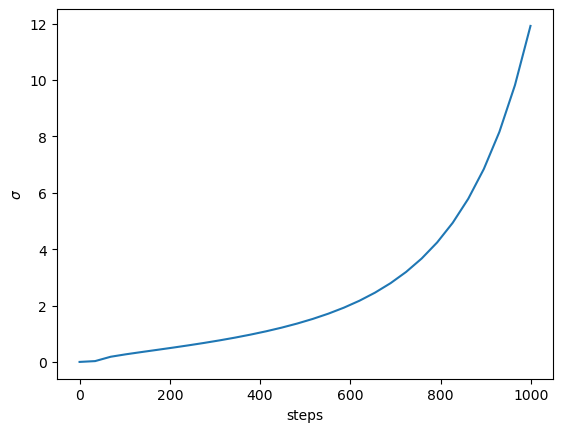

In [ ]:
plt.plot(schedular.timesteps,schedular.sigmas[1:])
plt.xlabel('steps')
plt.ylabel('$\sigma$')

schedular在训练的时候是对一张图片add noise，推理的时候决定如何denoise,我们通过以下代码，来看看不同t下对应的图片与noise关系

In [ ]:
with torch.no_grad():
    z=pil2Latents(input_image)
    noise=torch.rand_like(z).to(torch_device)
    gens=[]
    for s in [29,25,20,15]:
        z_noise=schedular.add_noise(z,noise,torch.tensor([schedular.timesteps[s]]))
        input_image_decoded=latents2Pil(z_noise)
        gens.append(input_image_decoded)

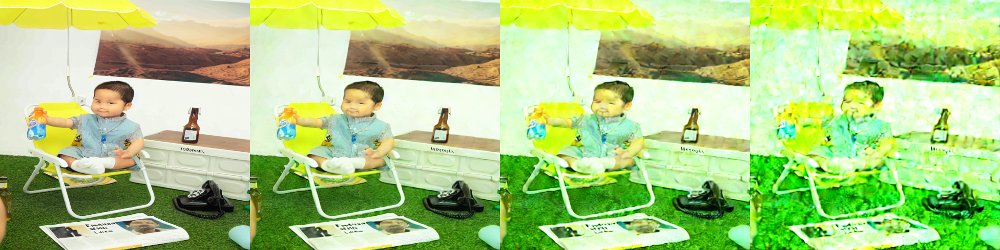

In [ ]:
image_grid(gens,1,4).resize((512*4,512))

## 完整的推理流程

In [ ]:
#| hide
from tqdm.auto import tqdm
from diffusers import AutoencoderKL,UNet2DConditionModel,LMSDiscreteScheduler
from transformers import CLIPTextModel, CLIPTokenizer
import torch,numpy as np 
from torchvision import transforms as tfms
from  PIL import Image

我们准备好我们需要的模型，vae,clip_tokener,clip_encoder,unet,schedular

In [ ]:
modelName="CompVis/stable-diffusion-v1-4"
# mirror='bfsu'
mirror=None


vae=AutoencoderKL.from_pretrained(modelName,subfolder='vae',mirror=mirror).to(torch_device)
tokenizer=CLIPTokenizer.from_pretrained(modelName,subfolder="tokenizer",mirror=mirror)
text_encoder=CLIPTextModel.from_pretrained(modelName,subfolder="text_encoder",mirror=mirror).to(torch_device)
unet=UNet2DConditionModel.from_pretrained(modelName,subfolder='unet',mirror=mirror).to(torch_device)
schedular=LMSDiscreteScheduler(beta_schedule='scaled_linear',beta_start=0.00085, beta_end=0.012 )

我们也可以直接从pipe中获得，这里的模型我用了单精度的。

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(modelName, 
                                               revision="fp16", 
                                               mirror=mirror,
                                               torch_dtype=torch.float16)
pipe.to(torch_device)

vae=pipe.vae
tokenizer=pipe.tokenizer
text_encoder=pipe.text_encoder
unet=pipe.unet
schedular=pipe.scheduler

我们还可以还原pipeline

In [ ]:
pipe=StableDiffusionPipeline(vae,text_encoder,tokenizer,unet,schedular,None,None)

0.setup

In [ ]:
prompt="A clear boy,catton style"
guide_factor=7.5
num_of_inference=50
schedular.set_timesteps(num_of_inference)

1.使用clip_encoder，生成【无prompt】和【prompt】的embbeding

**注意**：对于class free模型，是把 【无prompt】和【prompt】生成的`noise` 根据`guide_factor`进行组合后生成最终的`final_noise`，再去执行denoise操作。

In [ ]:
no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids


with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids]).to(torch_device)
    token_emb=text_encoder(ids).last_hidden_state

2.循环推理逻辑，输入model之前先scale 输入，生成pred_noise执行`schedular.step`,消除噪声。

In [ ]:
torch.manual_seed(1000)
img_latent=torch.randn(1,4,64,64).to(torch_device)
img_latent*=schedular.init_noise_sigma

with torch.no_grad():
    for t in tqdm(schedular.timesteps):
        inp=torch.concat([img_latent,img_latent])
        inp=schedular.scale_model_input(inp,t)
        
        noise=unet(inp,t,encoder_hidden_states=token_emb).sample
        
        pred_noise=noise[0]+guide_factor*(noise[1]-noise[0])
        
        img_latent=schedular.step(pred_noise,t,img_latent).prev_sample

  0%|          | 0/50 [00:00<?, ?it/s]

3.最后解码还原图片

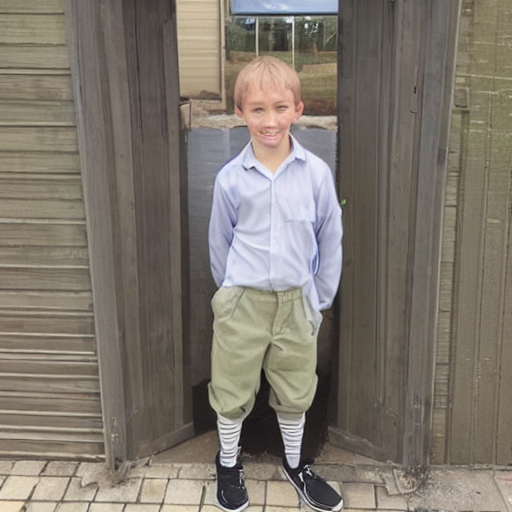

In [ ]:
final_latent=img_latent.detach()
latents2Pil(final_latent)

### A.guidance parameter update

存在一下4种调整

In [ ]:
def norm_none(u,g,t):
    return u+g*(t-u)
def norm_diff(u,g,t):
    'arunoda suggest'
    v=(t-u)/(t-u).norm()
    return u+g*u.norm()*v
def norm_whole(u,g,t): 
    'jeremy suggest'
    v=norm_none(u,g,t)
    return u.norm()*(v/v.norm())
def norm_diff_whole(u,g,t):
    'arunoda final'
    v=(t-u)/(t-u).norm()
    p=u+g*u.norm()*v
    return p/p.norm()*u.norm()

In [ ]:
def compare_guide(prompt,norm_method,guide_factor):
    num_of_inference=50
    schedular.set_timesteps(num_of_inference)


    no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
    guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids


    with torch.no_grad():
        ids=torch.cat([no_guide_ids,guide_ids]).to(torch_device)
        token_emb=text_encoder(ids).last_hidden_state

    torch.manual_seed(442)
    img_latent=torch.randn(1,4,64,64).to(torch_device)
    img_latent*=schedular.init_noise_sigma

    with torch.no_grad():
        for t in tqdm(schedular.timesteps):
            inp=torch.concat([img_latent,img_latent])
            inp=schedular.scale_model_input(inp,t)

            noise=unet(inp,t,encoder_hidden_states=token_emb).sample

            pred_noise=norm_method(noise[0],guide_factor,noise[1])

            img_latent=schedular.step(pred_noise,t,img_latent).prev_sample
    final_latent=img_latent.detach()
    return latents2Pil(final_latent)

比较下效果

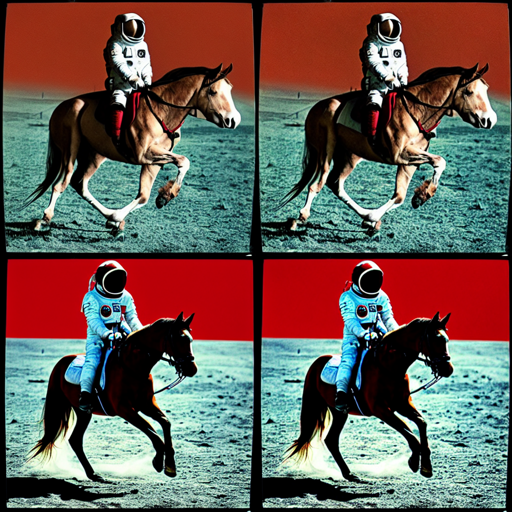

In [ ]:
prompt="a photograph of an astronaut riding a horse"
gen=[]
fs=[norm_none,norm_whole,norm_diff,norm_diff_whole]
gs=[7.5,7.5,0.15,0.15]
for m,g in zip(fs,gs):
    gen.append(compare_guide(prompt,m,g))
image_grid(gen,2,2).resize((512,512))

### 动态调整guide_scale

我们使用cosfit的方式调整guild_scalar的消息，具体的公式为：

$$g(t)=\frac{A}{2}[1+cos(\frac{\pi t}{S})]$$

<matplotlib.legend.Legend>

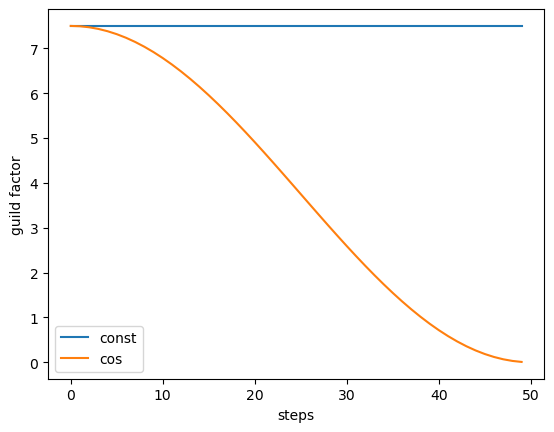

In [ ]:
steps,scalar=50,7.5

xx=np.linspace(0,steps-1,steps)
yy_constant=[scalar]*steps
yy_adjust=(scalar/2)*(1+np.cos(np.pi/steps * xx))

plt.plot(xx,yy_constant,label='const')
plt.plot(xx,yy_adjust,label='cos')
plt.xlabel('steps')
plt.ylabel('guild factor')
plt.legend()

In [ ]:
def get_guide_factor(t):
    return (guide_factor/2)*(1+np.cos(np.pi/num_of_inference * t))

下面的代码与【完整的推理流程】˙一致，唯一的更改就是使用`get_guide_factor(k)`来控制`pre_noise`的合成。



In [ ]:
prompt="A cartoon-style teddy bear with a tall top hat, brownish-red hair, and big eyes."
guide_factor=7.5
num_of_inference=50
schedular.set_timesteps(num_of_inference)


no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids

with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids]).to(torch_device)
    token_emb=text_encoder(ids).last_hidden_state
    
torch.manual_seed(442)
img_latent=torch.randn(1,4,64,64).to(torch_device)
img_latent*=schedular.init_noise_sigma

with torch.no_grad():
    for k,t in tqdm(enumerate(schedular.timesteps)):
        inp=torch.concat([img_latent,img_latent])
        inp=schedular.scale_model_input(inp,t)
        
        noise=unet(inp,t,encoder_hidden_states=token_emb).sample
        
        pred_noise=noise[0]+get_guide_factor(t)*(noise[1]-noise[0])
        
        img_latent=schedular.step(pred_noise,t,img_latent).prev_sample
latents2Pil(img_latent)

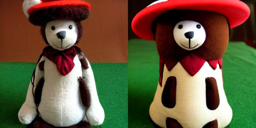

In [ ]:
image_grid([im1,im2],1,2).resize((256,128))

右边的图片是使用cosfit合成的图片，可以看出，明显的guide由于后期过小而导致图片并没有完全生成我们想要的样子。

## 基于embedding的微调应用

### Image2Image

先定义一张初始化图片

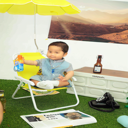

In [ ]:
with torch.no_grad():
    init_image = Image.open('yangyang.jpg').rotate(0).resize((512,512))
    init_latents=pil2Latents(init_image)
    im=latents2Pil(init_latents)
im.resize((128,128))

与【完整推理流程一样】，把提示词向量化，生成对应的`token_emb`

In [ ]:
prompt="A clear boy,catton style"
# torch.manual_seed(32)
guide_factor=8
num_of_inference=50
start_step=27

schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids


with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids]).to(torch_device)
    token_emb=text_encoder(ids).last_hidden_state

对初始化图片加入noise后，进行推理

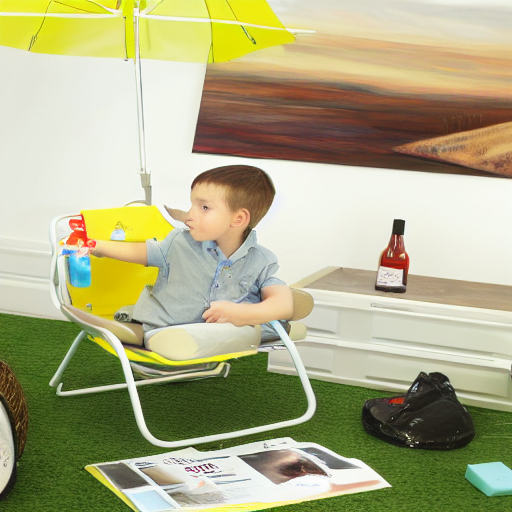

In [ ]:
torch.manual_seed(1000)
img_latent=torch.randn_like(init_latents)
img_latent=schedular.add_noise(init_latents,img_latent,schedular.timesteps[start_step:start_step+1])
# img_latent*=schedular.init_noise_sigma
img_latent.to(torch_device)


#bug1 img_latent=init_latents,这样生成的图片内容就是init_latents,不会受提示词控制
#bug2 schedular.add_noise没返回值,随机的noise，然后从start_step开始推理，引入的noise过小
#bug3 schedular.add_noise(img_latent,init_latents),把初始化图片当初noise
#bug4 img_latent*=schedular.init_noise_sigma 或者 img_latent*=schedular.sigma[t],引入过多的Noise

with torch.no_grad():
    for s in tqdm( range(len(schedular.timesteps)) ):
        if s>=start_step:     
            t=schedular.timesteps[s]
            inp=torch.concat([img_latent,img_latent])
            inp=schedular.scale_model_input(inp,t)

            noise=unet(inp,t,encoder_hidden_states=token_emb).sample

            # pred_noise=noise[0]+guide_factor*(noise[1]-noise[0])
            pred_noise=norm_whole(noise[0],guide_factor,noise[1])
            img_latent=schedular.step(pred_noise,t,img_latent).prev_sample
latents2Pil(img_latent)

**注意以下事项**
- 如果最终生成的图片`花屏`,说明加入的noise过大
- 如果最终生成单色的图片，那是因为schedular对图片的scale有问题。我犯过一个Bug是隐变量是随机的，从start_step=25步开始推理，这样导致schedular的noise等级比实际latent等级低很多，最终导致生成了单色图片
- latent的初始值应该是 【初始化图片】+[noise]。我犯过bug1是没有加入noise，这样`prompt`的指导作用完全消失。bug2,noise与【初始化图片】位置颠倒

### Negtive Prompt

否定的提示词实现，需要对text_encoder中embbeding的输出的【Prompt】与【negPrompt】的`词向量`进行操作，再输入到之后的网络模型。

In [ ]:
modelName="CompVis/stable-diffusion-v1-4"
mirror=None
pipe = StableDiffusionPipeline.from_pretrained(modelName, 
                                               revision="fp16", 
                                               mirror=mirror,
                                               torch_dtype=torch.float16)
pipe.to(torch_device)
vae=pipe.vae
tokenizer=pipe.tokenizer
text_encoder=pipe.text_encoder
unet=pipe.unet
schedular=pipe.scheduler

In [ ]:
def generate_baseon_prompt_emb(token_emb:torch.FloatTensor)->Image:
    '''
        本函数主要给mix embedding使用
        :param token_emb: 句子经过clip_encoder后的向量表示,(2,T,D) 
        :return:  denoise 后的图片
    '''
    img_latent=torch.randn(1,4,64,64,dtype=token_emb.dtype).to(token_emb.device)
    img_latent*=schedular.init_noise_sigma

    with torch.no_grad():
        for t in tqdm(schedular.timesteps):
            inp=torch.concat([img_latent,img_latent])
            inp=schedular.scale_model_input(inp,t)

            noise=unet(inp,t,encoder_hidden_states=token_emb).sample

            pred_noise=noise[0]+guide_factor*(noise[1]-noise[0])
            # pred_noise=noise[0]+guide_factor*(noise[1]-noise[0])/torch.norm(noise[1]-noise[0])*torch.norm(noise[0])
            img_latent=schedular.step(pred_noise,t,img_latent).prev_sample
    return latents2Pil(img_latent)

def get_output_embds(out_emb:torch.FloatTensor)->torch.FloatTensor:
    '''
        :param out_emb: 句子的词向量表示,(B,T,D) 
        :return:  out_emb经过text_encoder的输出
    '''
    causal_attention_mask = text_encoder.text_model._build_causal_attention_mask(2, tokenizer.model_max_length, dtype=out_emb.dtype)
    out_encoder=text_encoder.text_model.encoder(
                                inputs_embeds=out_emb,
                                causal_attention_mask=causal_attention_mask.to(out_emb.device),
                                output_hidden_states=True)
    out_final=text_encoder.text_model.final_layer_norm(out_encoder.last_hidden_state)

    return out_final

尝试把两个词向量相减,如果直接想减得到的是垃圾，我这里把neg prompt的词向量缩小后再想减。

In [ ]:
prompt = "A busy street in Paris on a summer day" 
# prompt="Alaskan Malamute"
neg_prompt="tree"

guide_factor=8
num_of_inference=50


schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_neg_ids=tokenizer(neg_prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids


weight=np.linspace(0,0.1,4)
all_embs=[]

with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids,guide_neg_ids]).to(torch_device)
    tmp_emb=text_encoder.text_model.embeddings(ids)
    # tmp_emb[0]->u, tmp_emb[1]->t,tmp_emb[2]->n
    uncondition_emb=tmp_emb[0]
    e1,e2=tmp_emb[1],tmp_emb[2]
    for w in weight:
        t=e1-w*e2
        token_emb_neg=get_output_embds(torch.stack([uncondition_emb,t]))
        all_embs.append(token_emb_neg)

显示结果

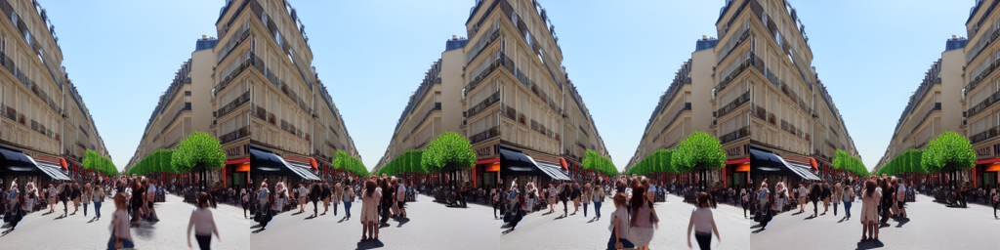

In [ ]:
gen=[]
for token_emb in all_embs:
    torch.manual_seed(777)
    im=generate_baseon_prompt_emb(token_emb)
    gen.append(im)
image_grid(gen, 1, 4).resize((256*4,256))

image_grid(gen, 1, 4).resize((2*512,512))

方法2, 输出的noise，使用类似guide的方式进行想减,我们定义以下5种生成最终pred_noise的方式，比较最终的结果

In [ ]:
def neg_pred_noise_1(noise):
    u,ta,n=noise.chunk(3)
    return n+guide_factor*(ta-n)
def neg_pred_noise_2(noise):
    u,ta,n=noise.chunk(3)
    return u+guide_factor*(ta-n)
def neg_pred_noise_3(noise):
    u,ta,n=noise.chunk(3)
    return u+guide_factor*(ta-n)+guide_factor*(ta-u)
def neg_pred_noise_4(noise):
    u,ta,n=noise.chunk(3)
    return  u+guide_factor*(ta-n)+guide_factor/2*(ta-u)
def neg_pred_noise_5(noise):
    u,ta,n=noise.chunk(3)
    return u+guide_factor/2*(ta-n)+guide_factor/2*(ta-u)

In [ ]:
def sd_inference(img_latent,token_emb,get_predict_noise)->Image:
    '''
        根据输入的隐变量(img_latent)与提示词(token_emb),返回最终解析的图片.我们加入参数
        get_predict_noise，把如何生成predict_noise的任务交给了调用者来觉得。
        
        :param img_latent:(4,64,64)
        :param  token_emb:(B,T,D)
        :get_predict_noise: 函数签名 f(noise) -> pred_noise,pred_noise是(4,64,64)的tensor
    '''
    with torch.no_grad():
        for t in tqdm(schedular.timesteps):
            inp=torch.concat([img_latent]*token_emb.shape[0])
            inp=schedular.scale_model_input(inp,t)

            noise=unet(inp,t,encoder_hidden_states=token_emb).sample
            pred_noise=get_predict_noise(noise)
            

            img_latent=schedular.step(pred_noise,t,img_latent).prev_sample
    return latents2Pil(img_latent)

In [ ]:
prompt = "A busy street in Paris on a summer day" 
# prompt="Alaskan Malamute"
neg_prompt="building and Eiffel Tower"

guide_factor=10
num_of_inference=50


schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_neg_ids=tokenizer(neg_prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids



with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids,guide_neg_ids]).to(torch_device)
    # tmp_emb[0]->u, tmp_emb[1]->ta,tmp_emb[2]->n
    token_emb=text_encoder(ids).last_hidden_state


gens=[]
for f in [neg_pred_noise_1,neg_pred_noise_2,neg_pred_noise_3,neg_pred_noise_4,neg_pred_noise_5]:
    torch.manual_seed(777)
    img_latent=torch.randn(1,4,64,64,dtype=vae.dtype).to(torch_device)
    img_latent*=schedular.init_noise_sigma
    I=sd_inference(img_latent,token_emb,f)
    gens.append(I)
image_grid(gens,1,5)

In [ ]:
image_grid(gens,1,4).save('neg_pairs.jpg')

![building,Eiffel Tower.jpg](imgs/building_Eiffel_Tower.jpg)



---



1.   第一幅画的天气是多云，与提示词部分，我想是和没事使用uncondtion的noise有关。
2.   第三幅话把建筑全部替代成树木了，与第四幅对比可以看出来，guild力度越大，替代的越彻底。



我们来来试试其他提示词

In [ ]:
prompt = "A busy street in Paris on a summer day" 
# prompt="Alaskan Malamute"
neg_prompt="building,Eiffel Tower,tree"

guide_factor=10
num_of_inference=50


schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_neg_ids=tokenizer(neg_prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids



with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids,guide_neg_ids]).to(torch_device)
    # tmp_emb[0]->u, tmp_emb[1]->ta,tmp_emb[2]->n
    token_emb=text_encoder(ids).last_hidden_state


gens=[]
for f in [neg_pred_noise_1,neg_pred_noise_2,neg_pred_noise_3,neg_pred_noise_4,neg_pred_noise_5]:
    torch.manual_seed(777)
    img_latent=torch.randn(1,4,64,64,dtype=vae.dtype).to(torch_device)
    img_latent*=schedular.init_noise_sigma
    I=sd_inference(img_latent,token_emb,f)
    gens.append(I)
image_grid(gens,1,5)

In [ ]:
image_grid(gens,1,5).save(f"{neg_prompt}.jpg")

![building,Eiffel Tower.jpg](imgs/building_Eiffel_Tower_tree.jpg)

### Mix  Embeddings

我们也可以把clip_encoder的输出向量进行融合，然后生成图片

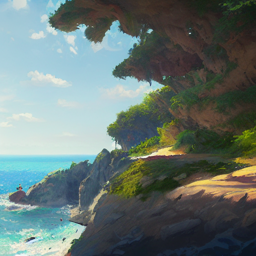

In [ ]:
prompt1="a mountain, cinematic angle, studio Ghibli, cinematic lighting, detailed oil painting, hyperrealistic, 8k"
prompt2="A long and winding beach, tropical, bright, simple, by Studio Ghibli and Greg Rutkowski, artstation"


guide_factor=7.5
num_of_inference=50


schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids_1=tokenizer(prompt1,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids_2=tokenizer(prompt2,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids

with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids_1,guide_ids_2]).to(torch_device)
    tmp_emb=text_encoder(ids).last_hidden_state
mix_factor=0.3
tmp_emb[1]=mix_factor*tmp_emb[1]+(1-mix_factor)*tmp_emb[2]
generate_baseon_prompt_emb(tmp_emb[0:2]).resize((256,256))

### Textual Inversion

Textual Inversion是通过 embedding层，生成 某种风格所对应的一个`新token的词向量`,然后用这个`新token的词向量`作为提示词，生成图片

1.下载预训练好的词向量

In [ ]:
!wget https://huggingface.co/sd-concepts-library/madhubani-art/resolve/main/learned_embeds.bin

In [ ]:
path="learned_embeds.bin"
embbed=torch.load(path,map_location=torch.device(torch_device))
key='<madhubani-art>'

2.加入新的`新token的词向量`作为提示词的输入

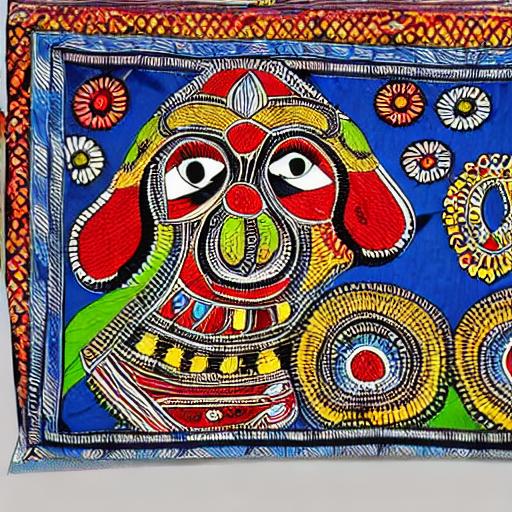

In [ ]:
prompt = "Labrador in the style of" 


guide_factor=7.5
num_of_inference=50


schedular.set_timesteps(num_of_inference)

no_guide_ids=tokenizer("",padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids
guide_ids=tokenizer(prompt,padding='max_length',max_length=tokenizer.model_max_length,return_tensors='pt').input_ids


with torch.no_grad():
    ids=torch.cat([no_guide_ids,guide_ids]).to(torch_device)
    tmp_emb=text_encoder.text_model.embeddings(ids)
    
    
    #获得所有49407token的索引位置
    _,indexC=torch.where(guide_ids==49407)
    #替换成madhubani的风格
    tmp_emb[1][indexC[0]]=embbed[key]

    token_emb=get_output_embds(tmp_emb)
generate_baseon_prompt_emb(token_emb)